<a href="https://colab.research.google.com/github/saidfreeds13/cultural_vibrancy/blob/main/Diversity_indexes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [11]:
!pip install osmnx mapclassify

In [12]:
!pip install "h3~=3.7"

In [13]:
!pip install contextily

In [14]:
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point, LineString, Polygon
import matplotlib.pyplot as plt
import folium
import mapclassify
import osmnx

In [105]:
import osmnx as ox
import geopandas as gpd
from shapely.geometry import mapping, Polygon
from h3.api.numpy_int import polyfill, h3_to_geo_boundary
import matplotlib.pyplot as plt
import math
import seaborn as sns

# DATA PROCESSING

In [16]:
loc = gpd.read_file("/content/arts_petr.gpkg")

In [17]:
loc = loc.to_crs(32636)
print(loc.crs)

EPSG:32636


In [18]:
spb1 = osmnx.geocoder.geocode_to_gdf("Петроградская")

In [19]:
spb1 = spb1.to_crs(epsg=32636)

In [20]:
loc_inside = gpd.sjoin(loc, spb1, predicate="within")

In [21]:
map = loc_inside.explore(tiles="CartoDB positron")
loc_inside.explore(
    m=map,
    color="purple")

# Diversity indexes

##Richness

In [22]:
def richness(group):
    return group['Рубрики'].nunique()

## Simpson Diversity

In [23]:
def simpson_diversity(group):
    proportions = group['Рубрики'].value_counts(normalize=True)
    return 1 - np.sum(proportions ** 2)

## Berger Parker

In [24]:
def berger_parker(group):
    proportions = group['Рубрики'].value_counts(normalize=True)
    # Berger-Parker = max proportion
    return proportions.max()

## Shannon weiner

In [25]:
def shannon_wiener_diversity(group):
    proportions = group['Рубрики'].value_counts(normalize=True)
    # Filter zero proportions to avoid log(0)
    proportions = proportions[proportions > 0]
    return -np.sum(proportions * np.log(proportions))

## Hill numbers

In [26]:
def hill_number_diversity(group, q=1):
    proportions = group['Рубрики'].value_counts(normalize=True)
    richness = len(proportions)

# Grid creation

In [ ]:
!pip install "h3~=3.7"

In [ ]:
import h3
print(h3.__version__)


3.7.7


Number of hexagons covering Петроградская: 10


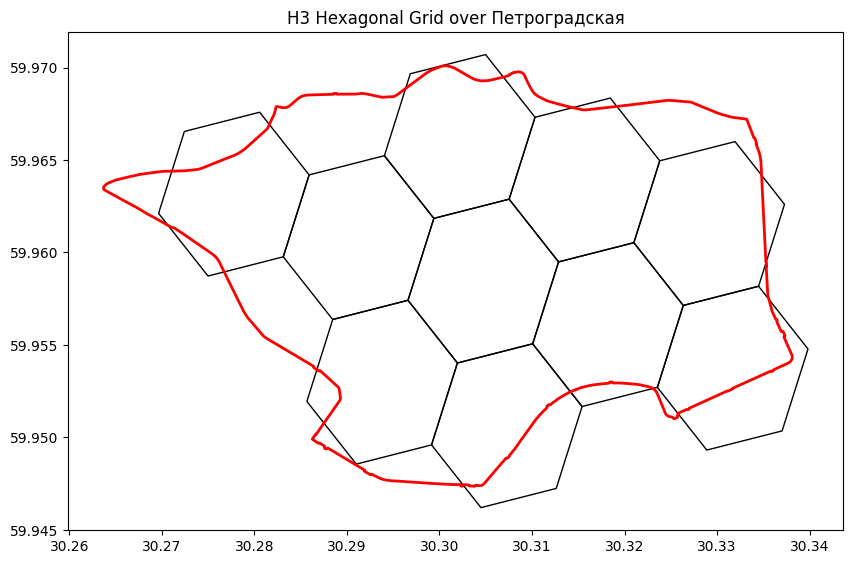

In [ ]:


# Step 1: Get the polygon for "Петроградская"
spb2_gdf = ox.geocode_to_gdf("Петроградская")
spb2 = spb2_gdf.geometry.iloc[0]

# Step 2: Convert polygon to geojson-like dict
geojson = mapping(spb2)

# Step 3: Swap coords from (lng, lat) to (lat, lng) for h3 numpy_int API
def swap_coords(geojson):
    coords = geojson['coordinates'][0]
    swapped = [(lat, lng) for lng, lat in coords]
    return {'type': 'Polygon', 'coordinates': [swapped]}

geojson_swapped = swap_coords(geojson)

# Step 4: Choose resolution and generate hexagons covering the polygon
resolution = 8
hex_ids = polyfill(geojson_swapped, resolution)

print(f"Number of hexagons covering Петроградская: {len(hex_ids)}")

# Step 5: Convert hex IDs to polygons for visualization
def hex_to_polygon(h):
    boundary = h3_to_geo_boundary(h, geo_json=True)
    return Polygon(boundary)

hex_polygons = [hex_to_polygon(h) for h in hex_ids]

# Create GeoDataFrame of hexagons
gdf_hex = gpd.GeoDataFrame({'h3_index': list(hex_ids)}, geometry=hex_polygons, crs='EPSG:4326')

# Step 6: Plot the hex grid and original polygon
ax = gdf_hex.plot(edgecolor='black', facecolor='none', figsize=(10,10))
spb2_gdf.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
plt.title("H3 Hexagonal Grid over Петроградская")
plt.show()


In [ ]:
grid_h = gdf_hex

In [ ]:
locations_on_grid = gpd.sjoin(loc, grid_h, how='inner', predicate='within')

<ipython-input-12-2351adf43a91>:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:32636
Right CRS: EPSG:4326

  locations_on_grid = gpd.sjoin(loc, grid_h, how='inner', predicate='within')


# **Cultural cityscape diversity**. Hexagons as a unit of calculation

## RICHNESS

In [ ]:
richness_p = locations_on_grid.groupby('h3_index').apply(richness)
richness_df = richness_p.rename('richness').reset_index()

grid2 = grid_h.merge(
    richness_df,
    left_on='h3_index',
    right_on='h3_index',
    how='left'
)


<ipython-input-266-66a9476658a5>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  richness_p = locations_on_grid.groupby('h3_index').apply(richness)


In [ ]:
grid2.explore(tiles="CartoDB positron", column = "richness")

## SIMPSON DIVERSITY

In [ ]:
simpson_diversity_p = locations_on_grid.groupby('h3_index').apply(simpson_diversity)
grid3 = grid_h.merge(simpson_diversity_p.rename('simpson'), left_on='h3_index',
    right_on='h3_index', how ="left")

<ipython-input-251-d95b310bcd62>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  simpson_diversity_p = locations_on_grid.groupby('h3_index').apply(simpson_diversity)


In [ ]:

grid3.explore(tiles="CartoDB positron", column = "simpson")


## Berger-Parker Abundance

In [ ]:
berger_parker_diversity = locations_on_grid.groupby('h3_index').apply(berger_parker)
grid4 = grid_h.merge(berger_parker_diversity.rename('berger_parker'), left_on='h3_index', right_on="h3_index", how = "left")

<ipython-input-268-82608771d192>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  berger_parker_diversity = locations_on_grid.groupby('h3_index').apply(berger_parker)


In [ ]:
berger_parker_diversity = locations_on_grid.groupby('h3_index').apply(berger_parker)
grid4 = grid_h.merge(berger_parker_diversity.rename('berger_parker'), left_on='h3_index', right_index=True)

<ipython-input-171-e1373d83707e>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  berger_parker_diversity = locations_on_grid.groupby('h3_index').apply(berger_parker)


In [ ]:
 grid4.explore(tiles="CartoDB positron", column="berger_parker")

In [ ]:
 grid4.explore(tiles="CartoDB positron", column="berger_parker")


This will give you a value between 0 and 1, where values closer to 1 indicate dominance by a single category

## shannon_wiener

In [ ]:
shannon_wiener_diversity_p = locations_on_grid.groupby('h3_index').apply(shannon_wiener_diversity)
grid5 = grid_h.merge(shannon_wiener_diversity_p.rename('shannon wiener'), left_on='h3_index', right_on='h3_index', how = "left")

<ipython-input-270-97ae787e794e>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  shannon_wiener_diversity_p = locations_on_grid.groupby('h3_index').apply(shannon_wiener_diversity)


In [ ]:
grid5.explore(tiles="CartoDB positron", column="shannon wiener")

# **Diversity of cultural cityscape**. Buildings as a unit of calculation

### Prelimenaries

In [61]:

place = "Петроградская, Saint Petersburg, Russia"
area = ox.geocode_to_gdf(place)


In [62]:
area

,geometry,bbox_west,bbox_south,bbox_east,bbox_north,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"POLYGON ((30.26368 59.96345, 30.26371 59.96342...",30.263684,59.947345,30.338124,59.970098,160345740,relation,1312683,59.960761,30.306623,place,suburb,19,0.398828,suburb,Petrograd Side,"Petrograd Side, округ Кронверкское, Saint Pete..."


In [63]:
tags = {"building": ["apartments", "residential"]}


In [64]:
aparts = ox.features.features_from_polygon(area.geometry.iloc[0], tags=tags)


In [65]:
aparts = aparts.to_crs(epsg=32636)

## 500 m buffer - 5 indexes

### preparation

In [66]:
aparts["buffer1"] = aparts.buffer(500)

In [67]:
aparts_n = aparts.set_geometry("buffer1")

In [68]:
locations_in_buffer = gpd.sjoin(loc, aparts_n, how='inner', predicate='within')

### 1. Richness

In [69]:
richness_pb = locations_in_buffer.groupby('geometry_right').apply(richness)
aparts_diversity_richness = aparts_n.merge(richness_pb.rename('richness'), left_on= "geometry", right_on= "geometry_right", how = "left")

<ipython-input-69-c7326396ea9d>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  richness_pb = locations_in_buffer.groupby('geometry_right').apply(richness)


In [70]:
aparts_diversity_richness = aparts_diversity_richness.set_geometry("geometry")

In [71]:
aparts_diversity_richness.explore(column = "richness")

### 2. SIMPSON DIVERSITY

In [72]:
simpson_diversity_pb = locations_in_buffer.groupby('geometry_right').apply(simpson_diversity)
aparts_simpson_diversity = aparts_n.merge(simpson_diversity_pb.rename('simpson'), left_on= "geometry", right_on= "geometry_right", how = "left")

<ipython-input-72-136603b2a856>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  simpson_diversity_pb = locations_in_buffer.groupby('geometry_right').apply(simpson_diversity)


In [73]:
aparts_simpson_diversity = aparts_simpson_diversity.set_geometry("geometry")

In [74]:
aparts_simpson_diversity.explore(column = "simpson")

### 3. Berger-Parker Abundance

In [75]:
berger_parker_diversity_pb = locations_in_buffer.groupby('geometry_right').apply(berger_parker)
aparts_berger_parker_diversity = aparts_n.merge(berger_parker_diversity_pb.rename('berger_parker'), left_on= "geometry", right_on= "geometry_right", how = "left")

<ipython-input-75-4cbeb36eeed5>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  berger_parker_diversity_pb = locations_in_buffer.groupby('geometry_right').apply(berger_parker)


In [76]:
aparts_berger_parker_diversity = aparts_berger_parker_diversity.set_geometry("geometry")

In [77]:
aparts_berger_parker_diversity.explore(column = "berger_parker")

In [78]:
aparts_berger_parker_diversity.explore(column = "berger_parker").save("aparts_berger_parker_diversity_map.html")

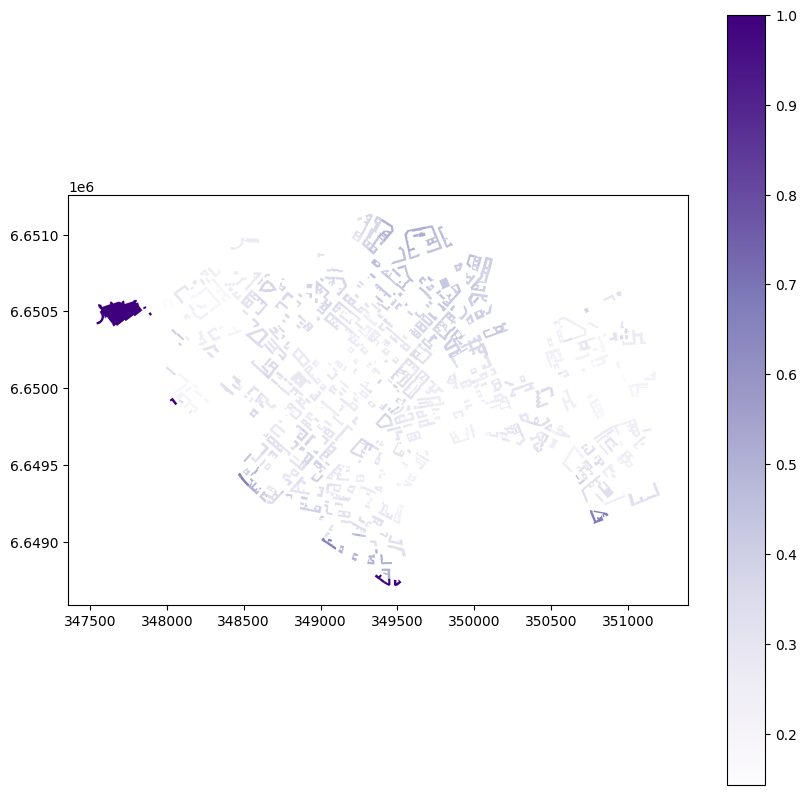

In [79]:
ax = aparts_berger_parker_diversity.plot(
    column="berger_parker",
    cmap="Purples",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("aparts_berger_parker_diversity_map.png", dpi=300)

In [80]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx


gdf = aparts_berger_parker_diversity.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))

gdf.plot(column='berger_parker', cmap='Purples', legend=True, ax=ax)


cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

ax.set_axis_off()

plt.savefig('map_with_basemap.png', dpi=300, bbox_inches='tight')
plt.close()



### 4. Shannon-Wiener equity

In [81]:
def shannon_wiener_equity(group):
    proportions = group['Рубрики'].value_counts(normalize=True)
    shannon_entropy = -np.sum(proportions * np.log(proportions))
    richness = len(proportions)
    if richness > 1:
        equity = shannon_entropy / np.log(richness)
    else:
        equity = 1.0
    return equity


In [82]:
shannon_wiener_equity_pb = locations_in_buffer.groupby('geometry_right').apply(shannon_wiener_equity)
aparts_shannon_wiener_equity = aparts_n.merge(shannon_wiener_equity_pb.rename('shannon_wiener_equity'), left_on= "geometry", right_on= "geometry_right", how = "left")

<ipython-input-82-9409462ea925>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  shannon_wiener_equity_pb = locations_in_buffer.groupby('geometry_right').apply(shannon_wiener_equity)


In [83]:
aparts_shannon_wiener_equity = aparts_shannon_wiener_equity.set_geometry("geometry")

In [84]:
aparts_shannon_wiener_equity.explore(column = "shannon_wiener_equity")

### 5. Shannon wiener

In [85]:
shannon_wiener_diversity_pb = locations_in_buffer.groupby('geometry_right').apply(shannon_wiener_diversity)
aparts_shannon_wiener_diversity = aparts_n.merge(shannon_wiener_diversity_pb.rename('shannon wiener'), left_on= "geometry", right_on= "geometry_right", how = "left")

<ipython-input-85-d43644a04d54>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  shannon_wiener_diversity_pb = locations_in_buffer.groupby('geometry_right').apply(shannon_wiener_diversity)


In [86]:
aparts_shannon_wiener_diversity = aparts_shannon_wiener_diversity.set_geometry("geometry")

In [96]:
aparts_shannon_wiener_diversity.explore(column = "shannon wiener")

### Merged dataset of diversity indexes

In [88]:
aparts_diversity = aparts_n

In [89]:
aparts_diversity = aparts_diversity.merge(richness_pb.rename('richness'), left_on= "geometry", right_on= "geometry_right", how = "left")
aparts_diversity = aparts_diversity.merge(simpson_diversity_pb.rename('simpson'), left_on= "geometry", right_on= "geometry_right", how = "left")
aparts_diversity = aparts_diversity.merge(berger_parker_diversity_pb.rename('berger_parker'), left_on= "geometry", right_on= "geometry_right", how = "left")
aparts_diversity = aparts_diversity.merge(shannon_wiener_equity_pb.rename('shannon_wiener_equity'), left_on= "geometry", right_on= "geometry_right", how = "left")
aparts_diversity = aparts_diversity.merge(shannon_wiener_diversity_pb.rename('shannon wiener'), left_on= "geometry", right_on= "geometry_right", how = "left")



aparts_diversity = aparts_diversity.set_geometry("geometry")

In [90]:
aparts_diversity1 = aparts_diversity[[ "geometry", "buffer1", "richness", "simpson", "berger_parker", "shannon_wiener_equity", "shannon wiener_x","Hill" ]]

KeyError: "['shannon wiener_x', 'Hill'] not in index"

In [ ]:
aparts_diversity1.iloc[1]

In [ ]:
aparts_diversity1.to_parquet("cultural_vibrancy.gpkg")

Shannon-Wiener Equity (Evenness) is misleading since the richness is low



# Results Visualisation

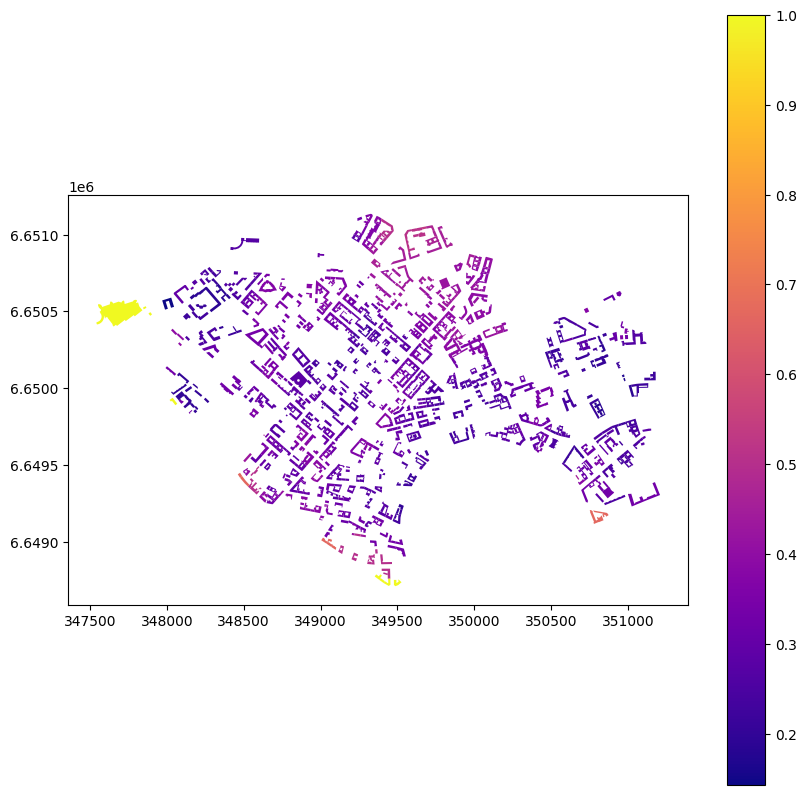

In [100]:
ax = aparts_diversity.plot(
    column="berger_parker",
    cmap="plasma",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("aparts_berger_parker_diversity_map.png", dpi=300)

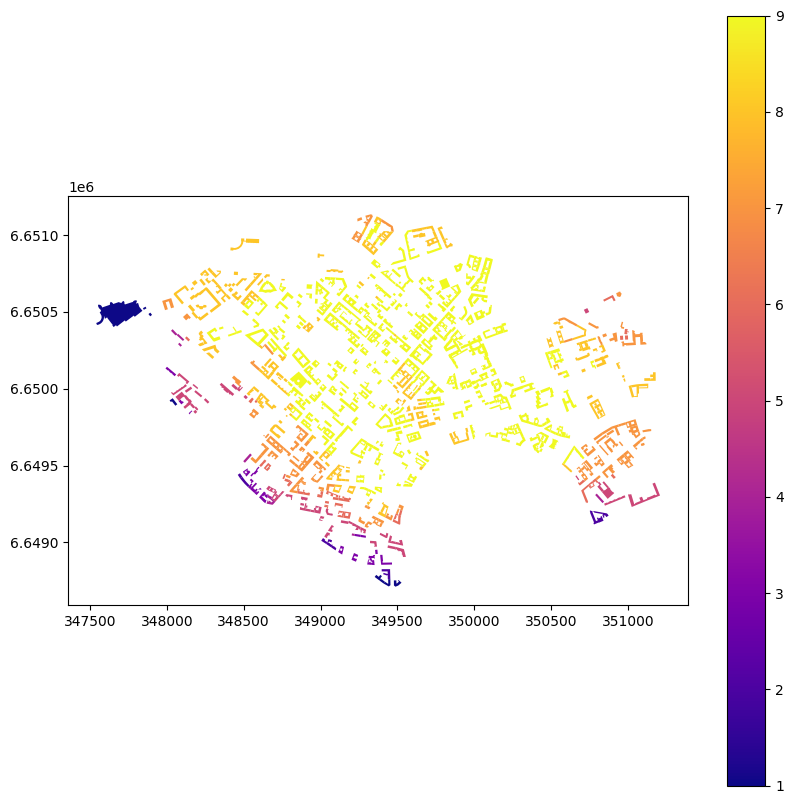

In [101]:
ax = aparts_diversity.plot(
    column="richness",
    cmap="plasma",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("richness_diversity_map.png", dpi=300)

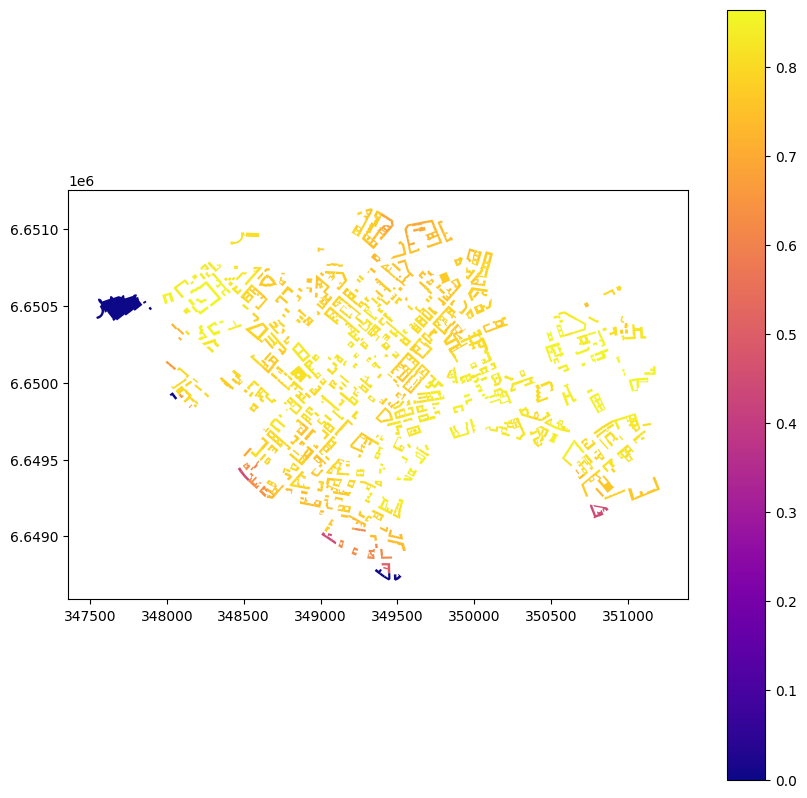

In [102]:
ax = aparts_diversity.plot(
    column="simpson",
    cmap="plasma",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("sipmoson_diversity_map.png", dpi=300)

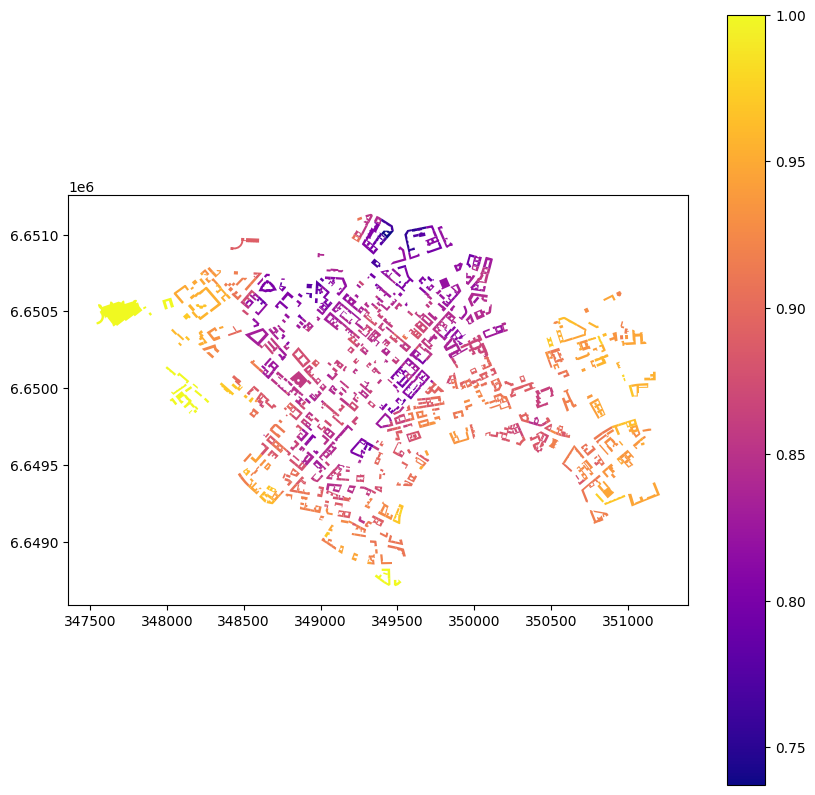

In [103]:
ax = aparts_diversity.plot(
    column="shannon_wiener_equity",
    cmap="plasma",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("shannon_wiener_equity_diversity_map.png", dpi=300)

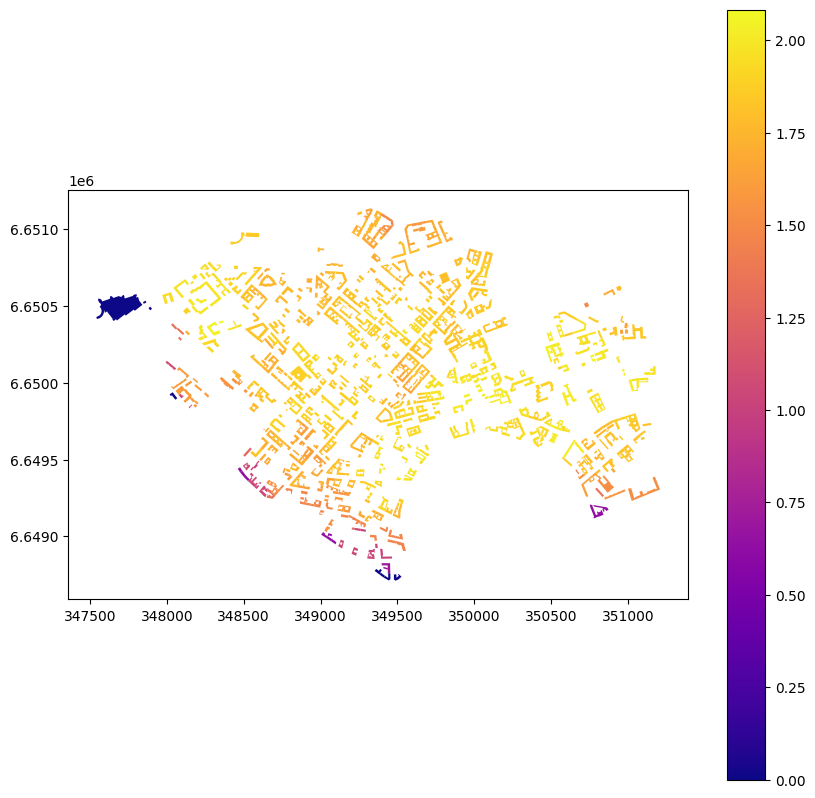

In [104]:
ax = aparts_diversity.plot(
    column="shannon wiener",
    cmap="plasma",
    legend=True,
    figsize=(10, 10)
)
plt.savefig("shannon wiener_diversity_map.png", dpi=300)

# Descriptive stats

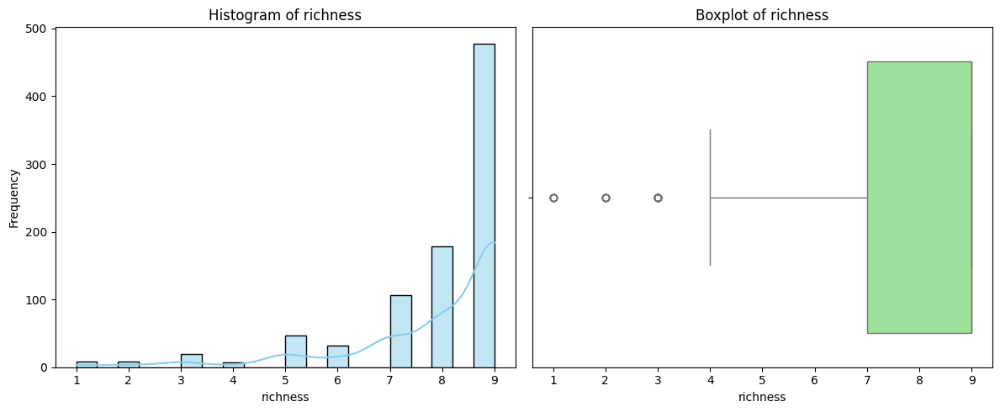

<Figure size 640x480 with 0 Axes>

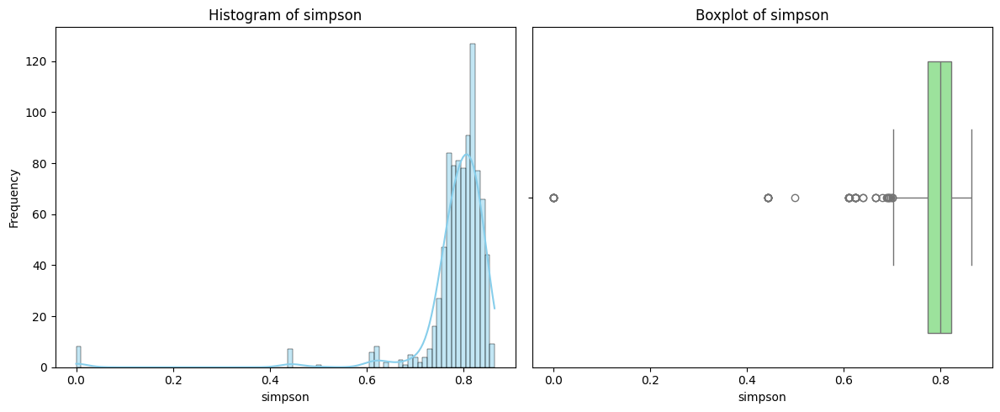

<Figure size 640x480 with 0 Axes>

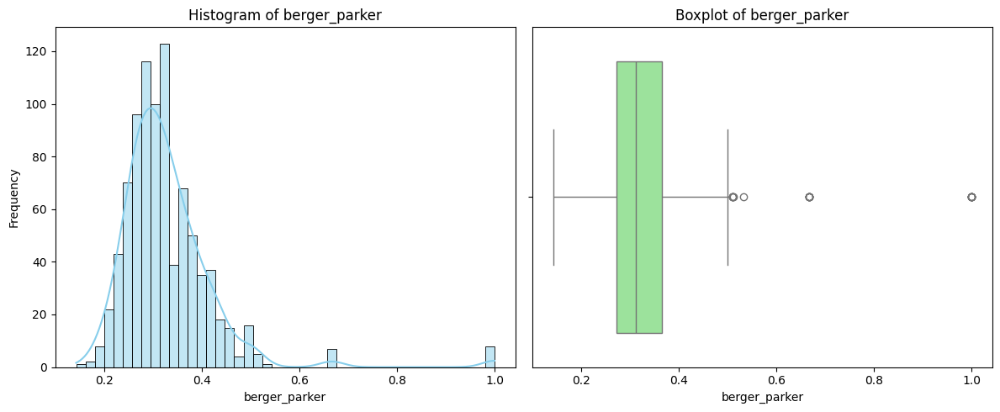

<Figure size 640x480 with 0 Axes>

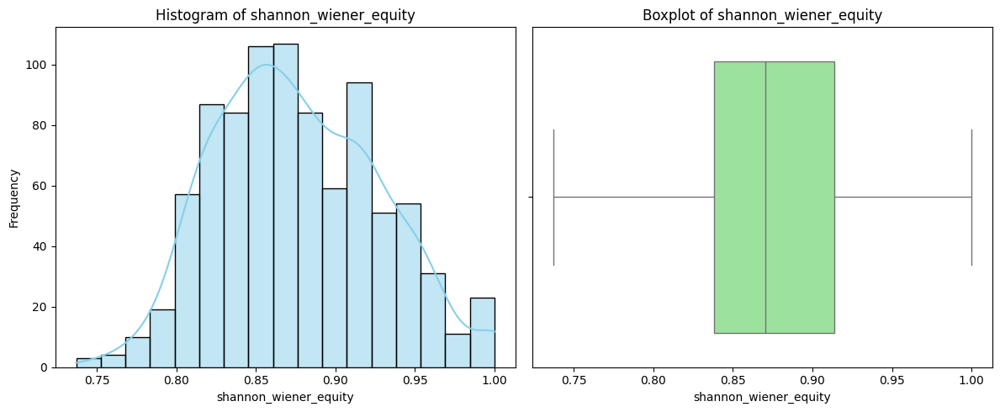

<Figure size 640x480 with 0 Axes>

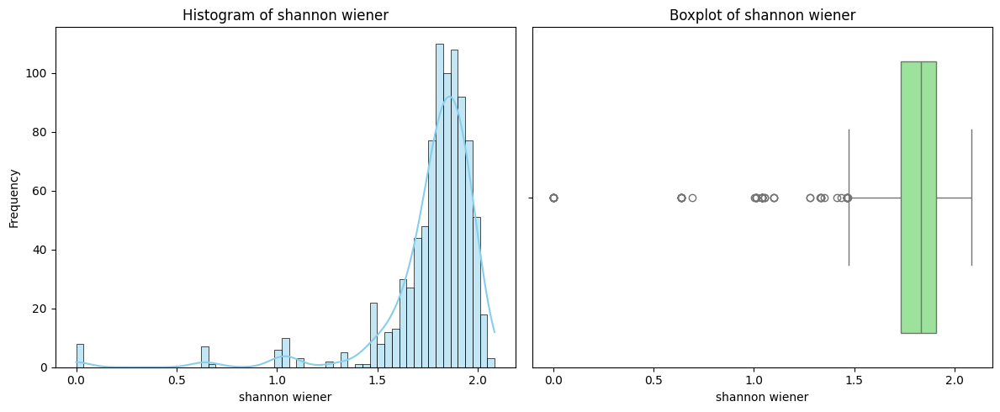

<Figure size 640x480 with 0 Axes>

In [108]:
for col in aparts_diversity.select_dtypes(include='number').columns:
    plt.figure(figsize=(12, 5))


    plt.subplot(1, 2, 1)
    sns.histplot(aparts_diversity[col], kde=True, color='skyblue')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')


    plt.subplot(1, 2, 2)
    sns.boxplot(x=aparts_diversity[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()

    plt.savefig(f'{col}descriptive statistics.png', dpi=300, bbox_inches='tight')
